In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as sio
from scipy.io import loadmat
from preprocess_methods import CausalIndividualLevel
from pathlib import Path

In [2]:
base_path = '../../Data/imbalanced performance/Full factorial design of experiments dataset for parallel-connected lithium-ion cells imbalanced performance investigation/Parallel-connected module experimental campaign/3_Module_level_experiments_fixed/Processed_data/'
cell_paths = ['Mixed', 'NCA', 'NMC']
is_aged = ['Aged', 'Unaged']
Res = [0, 1, 3]
Temp = [10, 25, 40]
machines = ['M1', 'M2']
experiments  = []
for c in cell_paths:
    for a in is_aged:
        for r in Res:
            for t in Temp:
                for m in machines:
                    new_path = (base_path + c + '_cells/' + a + '/R_' + str(r) + '/T_' + str(t) + '/'
                                           + m + '_' + c + '_' + a + '_R' + str(r) + '_T' + str(t) + '.mat')
                    if Path(new_path).exists():
                        new_data = sio.loadmat(new_path, struct_as_record=True, simplify_cells=True)
                        experiments.append([c, a, r, t, m, new_data])
                    
print(len(experiments)) 

54


In [3]:
experiment_data = []
for experiment in experiments:
    #'Test_Times', 'Step_Times', 'Step_Index', 'Cycle_Index', 'VoltageV', 'CurrentA', 'TemperatureC_Cell_1', 'TemperatureC_Cell_2', 'TemperatureC_Cell_3', 'TemperatureC_Cell_4', 
    # 'Ambient_TemperatureC', 'CurrentA_Cell_1', 'CurrentA_Cell_2', 'CurrentA_Cell_3', 'CurrentA_Cell_4'
    experiment_info = {
        'Test_Times': experiment[5]['Data_processed']["Data"]['Test_Times'], 
        'Step_Times': experiment[5]['Data_processed']["Data"]['Step_Times'],
        'Cycle_Index': experiment[5]['Data_processed']["Data"]['Cycle_Index'],
        'Step_Index': experiment[5]['Data_processed']["Data"]['Step_Index'],
        'VoltageV' : experiment[5]['Data_processed']["Data"]['VoltageV'],
        'CurrentA' : experiment[5]['Data_processed']["Data"]['CurrentA'],
        'TemperatureC_Cell_1' : experiment[5]['Data_processed']["Data"]['TemperatureC_Cell_1'],
        'TemperatureC_Cell_2' : experiment[5]['Data_processed']["Data"]['TemperatureC_Cell_2'],
        'TemperatureC_Cell_3' : experiment[5]['Data_processed']["Data"]['TemperatureC_Cell_3'],
        'TemperatureC_Cell_4' : experiment[5]['Data_processed']["Data"]['TemperatureC_Cell_4'],
        'Ambient_TemperatureC' : experiment[5]['Data_processed']["Data"]['Ambient_TemperatureC'],
        'CurrentA_Cell_1' : experiment[5]['Data_processed']["Data"]['CurrentA_Cell_1'],
        'CurrentA_Cell_2' : experiment[5]['Data_processed']["Data"]['CurrentA_Cell_2'],
        'CurrentA_Cell_3' : experiment[5]['Data_processed']["Data"]['CurrentA_Cell_3'],
        'CurrentA_Cell_4' : experiment[5]['Data_processed']["Data"]['CurrentA_Cell_4'],
    }
    experiment_data.append(experiment_info)

cell_dataset = pd.DataFrame(experiment_data)
print(cell_dataset.head())

                                          Test_Times  \
0  [1.0003, 2.0003, 3.0002, 4.0001, 5.0003, 6.000...   
1  [1.0003, 2.0003, 3.0, 4.0004, 5.0001, 6.0003, ...   
2  [1.0005, 2.0003, 3.0002, 4.0004, 5.0005, 6.000...   
3  [1.0004, 2.0005, 3.0003, 4.0, 5.0, 6.0005, 7.0...   
4  [1.0, 2.0005, 3.0003, 4.0002, 5.0004, 6.0005, ...   

                                          Step_Times  \
0  [1.0002, 2.0002, 3.0001, 4.0, 5.0002, 6.0, 7.0...   
1  [1.0002, 2.0002, 2.9999, 4.0003, 5.0, 6.0002, ...   
2  [1.0004, 2.0002, 3.0001, 4.0003, 5.0004, 6.0, ...   
3  [1.0003, 2.0004, 3.0002, 3.9999, 4.9999, 6.000...   
4  [0.9999, 2.0004, 3.0002, 4.0001, 5.0003, 6.000...   

                                         Cycle_Index  \
0  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   
1  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   
2  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   
3  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   
4  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [4]:
groups = [[1, 4, 6], [2, 7], [3, 8], [5]]
cols = ['Step_Index', 'Ambient_TemperatureC', 'VoltageV', 'CurrentA', 'TemperatureC_Cell_1', 'TemperatureC_Cell_2', 'TemperatureC_Cell_3', 'TemperatureC_Cell_4','CurrentA_Cell_1', 'CurrentA_Cell_2', 'CurrentA_Cell_3','CurrentA_Cell_4']
sub_df_1 = CausalIndividualLevel.splitDataForEachByStep(data=cell_dataset, cols=cols, groups=groups)
print(sub_df_1[1][1][0])

      Step_Index  Ambient_TemperatureC  VoltageV  CurrentA  \
0              1             26.936308  3.567622       0.0   
1              1             26.936308  3.567875       0.0   
2              1             26.896051  3.567622       0.0   
3              1             26.940262  3.567496       0.0   
4              1             26.867476  3.567433       0.0   
...          ...                   ...       ...       ...   
6298           6             25.217685  2.991672       0.0   
6299           6             25.225606  2.991798       0.0   
6300           6             25.188339  2.991924       0.0   
6301           6             25.231184  2.991924       0.0   
6302           6             25.231188  2.991861       0.0   

      TemperatureC_Cell_1  TemperatureC_Cell_2  TemperatureC_Cell_3  \
0               25.754311            26.010895            26.025146   
1               25.754311            26.010895            26.025146   
2               25.728214            25.97

In [5]:
save_point_obs = '../../Src/structures/3modular_level/images/obs'
CausalIndividualLevel.observational_struct_learning(sub_df_1, 0, save_point_obs, sort_by='Step_Index',type="module")

100%|██████████| 20/20 [00:01<00:00, 13.24it/s]


Found 53 unique DAGs.


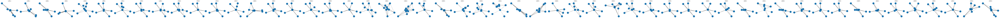

In [6]:
obs_unique_dags, obs_summary = CausalIndividualLevel.load_and_visualize_unique_dags(save_point_obs)
#'Ambient_TemperatureC', 'VoltageV', 'CurrentA', 'TemperatureC_Cell_1', 'TemperatureC_Cell_2', 
#'TemperatureC_Cell_3', 'TemperatureC_Cell_4','CurrentA_Cell_1', 'CurrentA_Cell_2', 'CurrentA_Cell_3','CurrentA_Cell_4']

In [7]:
save_point_int = '../../Src/structures/3modular_level/images/int'
CausalIndividualLevel.observational_struct_learning(sub_df_1, 1, save_point_int, sort_by='Step_Index',type="module")

100%|██████████| 20/20 [00:01<00:00, 15.77it/s]


In [8]:
int_unique_dags, int_summary = CausalIndividualLevel.load_and_visualize_unique_dags(save_point_int)
#'Ambient_TemperatureC', 'VoltageV', 'CurrentA', 'TemperatureC_Cell_1', 'TemperatureC_Cell_2', 
#'TemperatureC_Cell_3', 'TemperatureC_Cell_4','CurrentA_Cell_1', 'CurrentA_Cell_2', 'CurrentA_Cell_3','CurrentA_Cell_4']

Found 196 unique DAGs.
